In [812]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import scipy.stats as stats
import seaborn as sns
import plotly.express as px
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

pd.set_option('display.max_rows', None, 'display.max_columns', 500)


In [813]:
#reading in the dataframe
df = pd.read_csv('./data/air_walk_merged_clean.csv')

In [ ]:
#filepath
#/Users/airtonkamdem/GA_DSI/submit/projects/project4/2Walking-Clean-main/airton_project4_viz_clean_data.ipynb

In [570]:
# Dataframe already filtered to outside monitors, the below is not needed
# #seperating inside and outside monitor readings
# dfout = df[df['location_type'] == 'outside']
# dfin = df[df['location_type'] != 'outside']
dfout = df.copy()

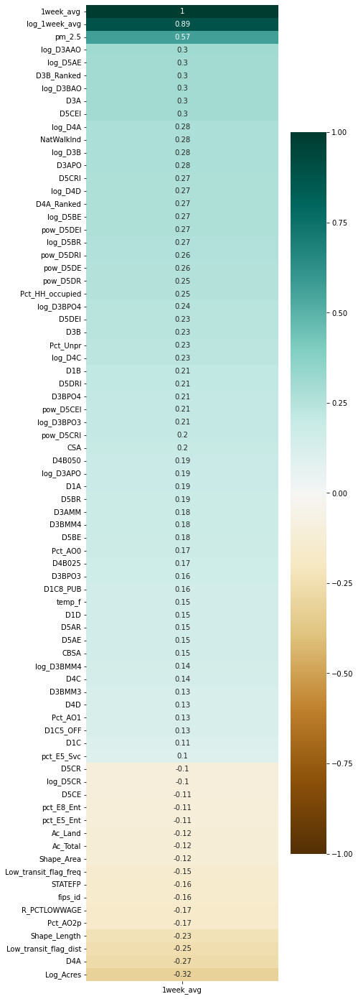

In [814]:
plt.figure(figsize=(6, 25))
col = '1week_avg'
dfcorr = df.corr()[[col]]
heatmap = sns.heatmap(dfcorr[np.abs(dfcorr[col]) > 0.1].sort_values
    (by=col, ascending=False), vmin=-1, vmax=1, annot=True, cmap='BrBG')

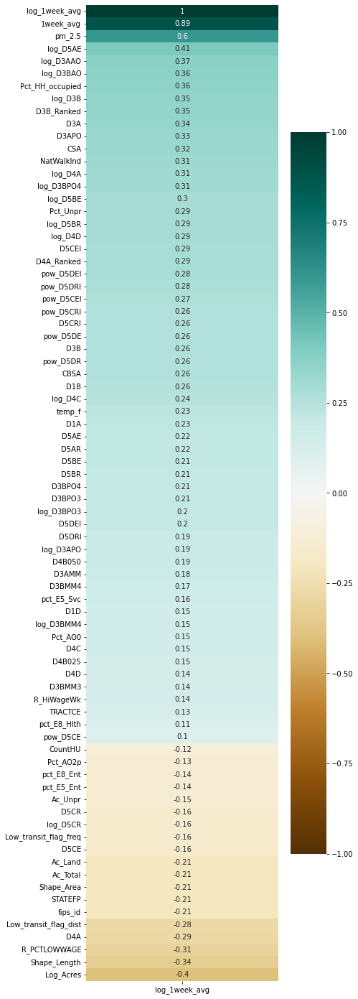

In [815]:
plt.figure(figsize=(6, 25))
col = 'log_1week_avg'
dfcorr = df.corr()[[col]]
heatmap = sns.heatmap(dfcorr[np.abs(dfcorr[col]) > 0.1].sort_values
    (by=col, ascending=False), vmin=-1, vmax=1, annot=True, cmap='BrBG')

In [817]:
target = "log_1week_avg"

In [818]:
#selecting the three major cities in California, LA/SF/SAC
cities = df[df['CSA_Name'].str.contains("Sacramento") | df['CSA_Name'].str.contains("Angeles") | df['CSA_Name'].str.contains("Francisco")]

In [819]:
cities.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4970 entries, 2 to 6567
Columns: 171 entries, name to log_1week_avg
dtypes: bool(6), float64(122), int64(39), object(4)
memory usage: 6.3+ MB


In [820]:
#Splitting the data by urban versus suburban regions -- at the median value for D1B which is population density
cities.D1B.median()

6.245244414

In [823]:
#Splitting the data by urban versus suburban regions -- at the median value for D1B which is population density
urban = cities[cities['D1B'].astype(int) >= 6.245244414]
urban.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2313 entries, 2 to 6567
Columns: 171 entries, name to log_1week_avg
dtypes: bool(6), float64(122), int64(39), object(4)
memory usage: 2.9+ MB


In [824]:
#Splitting the data by urban versus suburban regions -- at the median value for D1B which is population density
suburban = cities[cities['D1B'].astype(int) < 6.245244414]
suburban.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2657 entries, 6 to 6564
Columns: 171 entries, name to log_1week_avg
dtypes: bool(6), float64(122), int64(39), object(4)
memory usage: 3.4+ MB


In [825]:
#adding a column that states whether or no each value is urban and concatenating the values back together
suburban['locality'] = 'Sub-Urban'
urban['locality'] = 'Urban'
localities = pd.concat([suburban, urban], ignore_index=False, sort=False)
localities.locality.value_counts()
#localities = localities[localities.index.duplicated()]

/var/folders/w3/8j3br3pn37q4dc1yqw7571580000gn/T/ipykernel_68647/924066305.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/w3/8j3br3pn37q4dc1yqw7571580000gn/T/ipykernel_68647/924066305.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Sub-Urban    2657
Urban        2313
Name: locality, dtype: int64

In [826]:
#setting a palette for the  visualizations
palette = {
    'Los Angeles-Long Beach, CA': 'tab:blue',
    'Sacramento-Roseville, CA': 'tab:red',
    'San Jose-San Francisco-Oakland, CA': 'tab:green',
    'Urban': 'tab:pink',
    'Sub-Urban': 'tab:grey'
}

### $1 Air Quality by region 

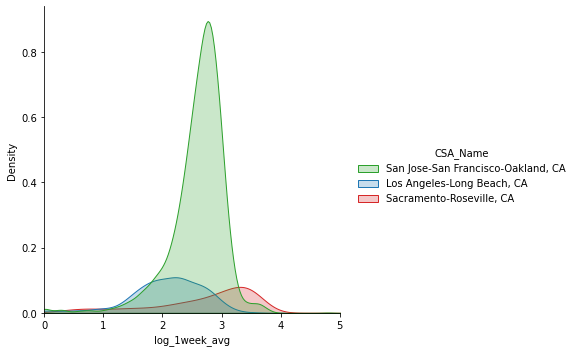

In [827]:
#LOGGED
#visualization by Census block group FIPS code in which CBG resides
ax = sns.displot(localities, x=target, hue="CSA_Name", kind="kde", palette=palette, fill=True)
ax.set(xlim=(0, 5))

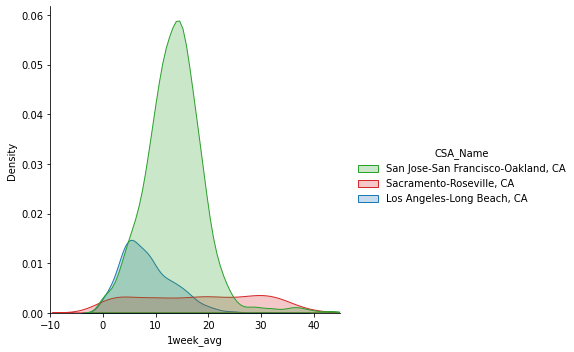

In [829]:
#NOT LOGGED
ax = sns.displot(localities, x='1week_avg', hue="CSA_Name",
                 kind="kde", palette=palette, fill=True)
ax.set(xlim=(-10, 45))

In [832]:
#LOGGED
#Urband Areas are more represented in areas poorly ranked for air quality 
fig = px.bar(localities, x='NatWalkInd', y=target,
             color="locality", title="Long-Form Input")

fig.show()

### $2 Air Quality by locality 

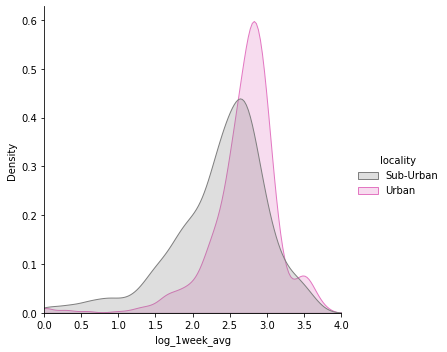

In [833]:
#### LOGGED Air Quality by locality
#visualization by Census block group FIPS code in which CBG resides
ax = sns.displot(localities, x=target, hue="locality",
                 kind="kde", palette=palette, fill=True)
ax.set(xlim=(0, 4))

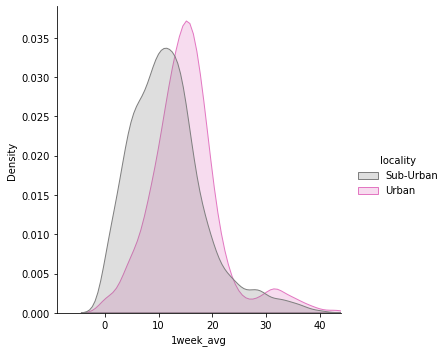

In [834]:
#### NOT LOGGED Air Quality by locality
#visualization by Census block group FIPS code in which CBG resides
ax = sns.displot(localities, x='1week_avg', hue="locality",
                 kind="kde", palette=palette, fill=True)
ax.set(xlim=(-9, 44))

In [835]:
#tried renaming column names for human readability, but decided to just adjust the plot axes
df.rename(columns={'1week_avg': 'One Week Air Quality Average (lower values are cleaner)', 
             'BLKGRPCE': 'Census Block Group',
             'CSA_Name': 'Combined Statistical Area (CSA)',
             'log_1week_avg': 'Log of the One Week Air Quality Average',
             'Low_transit_flag_dist': 'CSA is a low transit region',
             'NatWalkInd': 'Walkability ranking (high values are more walkable)',
             'TotPop': 'Total Population',
             'temp_f': 'Temperature (Fahrenheit)',
             'CBSA_POP': 'Population of the Core Based Statistical Area(CBSA)',
             'HH': 'Households (occupied housing units), 2018',
             'CBSA_POP': 'Population of a Core Based Statistical Area(CBSA)',
             'Log_Acres': 'Log of Acres',
             'log_D3BAO': 'Lof of Intersection density in terms of auto-oriented intersections per square mile',
             'log_D5AE': 'Log of Working age population within 45 minutes auto travel time',
             'CBSA_EMP': 'Total employment in CBSA',
             'D4A_Ranked': 'Quantile ranked order -- lowest to highest',
             'R_PCTLOWWAGE': 'Percent of low wage workers, 2017',
             'R_HiWageWk': 'Count of workers earning $3333/month or more, 2017',
             'D3A': 'Total road network density'
             'Ac_Total': 'Total geometric area (acres) of the CBG',
             'R_HiWageWk': 'Total water area (acres)',
             'Ac_Water': 'Count of workers earning $3333/month or more, 2017',
             'Ac_Land': 'Total land area (acres)',
             'P_WrkAge': 'Percent of population that is working aged 18 to 64 years',
             'E5_Ind': 'Industrial jobs within a 5-tier employment classification scheme',
             'E8_Off': 'Office jobs within an 8-tier employment classification scheme',
             'E8_Ind': 'Industrial jobs within an 8-tier employment classification scheme',
             'D1b': 'Gross population density (people/acre) on unprotected land',
             'D1a': 'Gross residential density (HU/acre) on unprotected land',
             'D1c': 'Gross employment density (jobs/acre) on unprotected land',
             'D1c5_Ret': 'Gross retail (5-tier) employment density (jobs/acre) on unprotected land',
             'D1c5_Ind': 'Gross industrial (5-tier) employment density (jobs/acre) on unprotected land',
             'D1c8_Ind': 'Gross industrial (8-tier) employment density (jobs/acre) on unprotected land',
             'D1c8_Pub': 'Gross retail (8-tier) employment density (jobs/acre) on unprotected land',
             'D1d': '"Gross activity density(employment + HUs) on unprotected land "',
             'D3a': 'Total road network density',
             'D3b': 'Street intersection density (weighted, auto-oriented intersections eliminated)',
             'D3bao': 'Intersection density in terms of auto-oriented intersections per square mile',
             'D4c': 'Aggregate frequency of transit service within 0.25 miles of CBG boundary per hour during evening peak period',
             'D4d': 'Aggregate frequency of transit service per square mile',
             'D5ae': 'Working age population within 45 minutes auto travel time',
             'D5br ': 'Jobs within 45-minute transit commute'
             'D4c': 'Count of workers earning $3333/month or more, 2017', 
             'D4c': 'Count of workers earning $3333/month or more, 2017'})


SyntaxError: expression cannot contain assignment, perhaps you meant "=="? (1642653588.py, line 2)

In [836]:
#this is a potential drop list
'''droplist = ['CBSA', 'CSA_Name', 'CSA', 'CBSA_Name', 'COUNTYFP', 'STATEFP',
            'CBSA_POP', 'CBSA_EMP', 'CBSA_WRK',  'is_owner', 'downgraded', 'flagged', 'hidden']
            dfout.drop(columns=droplist, inplace=True)
            '''

"droplist = ['CBSA', 'CSA_Name', 'CSA', 'CBSA_Name', 'COUNTYFP', 'STATEFP',\n            'CBSA_POP', 'CBSA_EMP', 'CBSA_WRK',  'is_owner', 'downgraded', 'flagged', 'hidden']\n            dfout.drop(columns=droplist, inplace=True)\n            "

In [837]:
'''la = df[df['CSA_Name'].str.contains("Angeles")]
sac = df[df['CSA_Name'].str.contains( "Sacramento")]'''

'la = df[df[\'CSA_Name\'].str.contains("Angeles")]\nsac = df[df[\'CSA_Name\'].str.contains( "Sacramento")]'

## $3 Comparing AQI accross the three regions with bar plots

In [838]:
#LOGGED
df = px.data.tips()
fig = px.histogram(localities, x="locality", y=target,
                   color='CSA_Name', barmode='group',
                   histfunc='avg',
                   height=400)
fig.update_layout(
    title="Log of 7 day Air Quality average (AQI) by logality and region",
    #xaxis_title="Log of 1 week AQI",
    yaxis_title="Log of 1 week AQI",
    legend_title="Combined Statistical Area (CSA)",
    font=dict(
        family="Courier New, monospace",
        size=12,
        color="RebeccaPurple"
    )
)
fig.show()
#BLKGRPCE
#NatWalkInd

In [839]:
#NOT LOGGED
df = px.data.tips()
fig = px.histogram(localities, x="locality", y='1week_avg',
                   color='CSA_Name', barmode='group',
                   histfunc='avg',
                   height=400,
                   width=1000)
fig.update_layout(
    title="Log of 7 day Air Quality average (AQI) by logality and Combine d Statistical Area (CSA)",
    #xaxis_title="Log of 1 week AQI",
    yaxis_title="Log of 1 week AQI",
    legend_title="Combined Statistical Area (CSA)",
    font=dict(
        family="Courier New, monospace",
        size=12,
        color="RebeccaPurple"
    )
)
fig.show()
#BLKGRPCE
#NatWalkInd
##WE LIKE THIS

### $4 Comparing the average walkability index by CSA and locality

In [840]:
df = px.data.tips()
fig = px.histogram(localities, x="locality", y='NatWalkInd',
                   color='CSA_Name', barmode='group',
                   histfunc='avg',
                   height=400)
fig.show()
#BLKGRPCE
#NatWalkInd

<AxesSubplot:xlabel='CSA_Name', ylabel='NatWalkInd'>

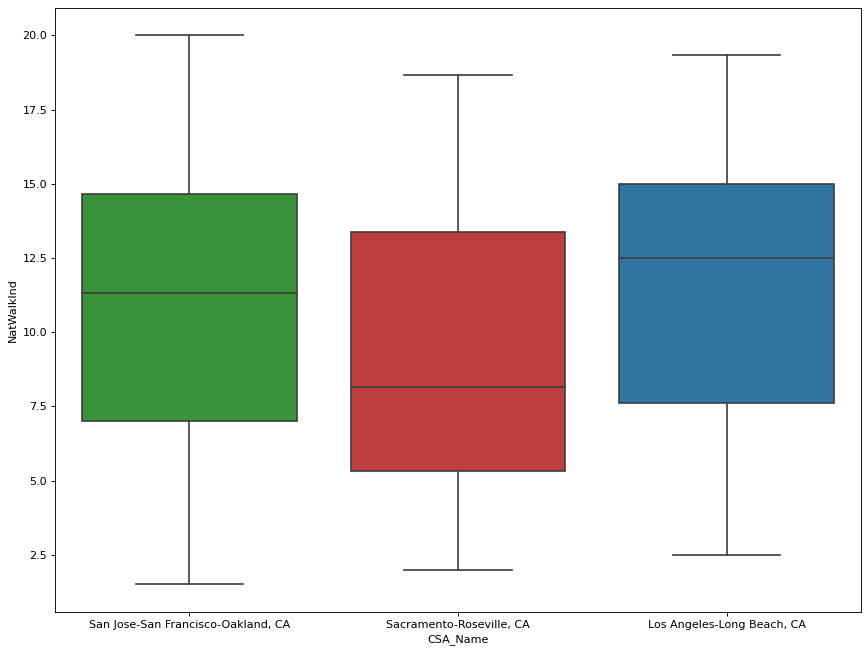

In [841]:
# BOX Plot of rankings by metropolitan area
plt.figure(figsize=(13, 10), dpi=80)
sns.boxplot(x='CSA_Name', y='NatWalkInd',
            palette=palette, data=localities, notch=False)

<AxesSubplot:xlabel='CSA_Name', ylabel='NatWalkInd'>

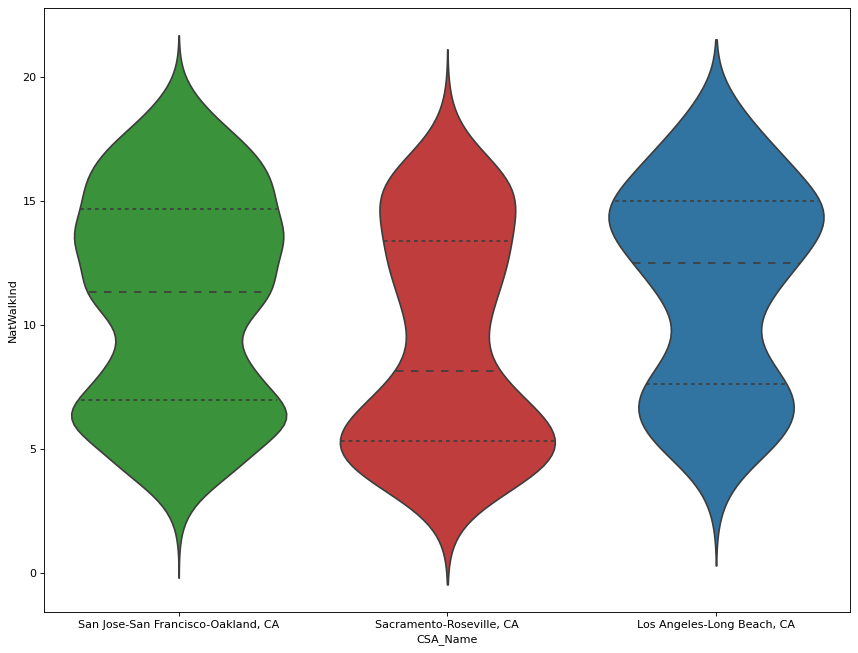

In [842]:
# Violin Plot of rankings by metropolitan area
plt.figure(figsize=(13, 10), dpi=80)
sns.violinplot(x='CSA_Name', y='NatWalkInd', data=localities, palette=palette,
               scale='width', inner='quartile')

### $5 POPULATION BY REGION AND LOCALITY

<AxesSubplot:xlabel='locality', ylabel='TotPop'>

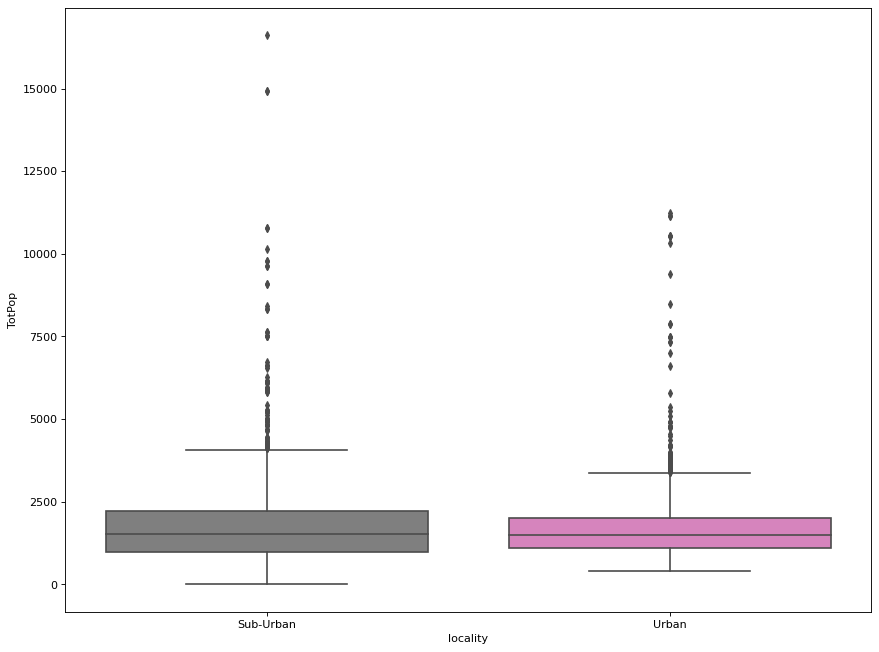

In [671]:
#POPULATION BY LOCALITY
plt.figure(figsize=(13, 10), dpi=80)
sns.boxplot(x='locality', y='TotPop', data=localities,palette=palette, notch=False)

<AxesSubplot:xlabel='CSA_Name', ylabel='1week_avg'>

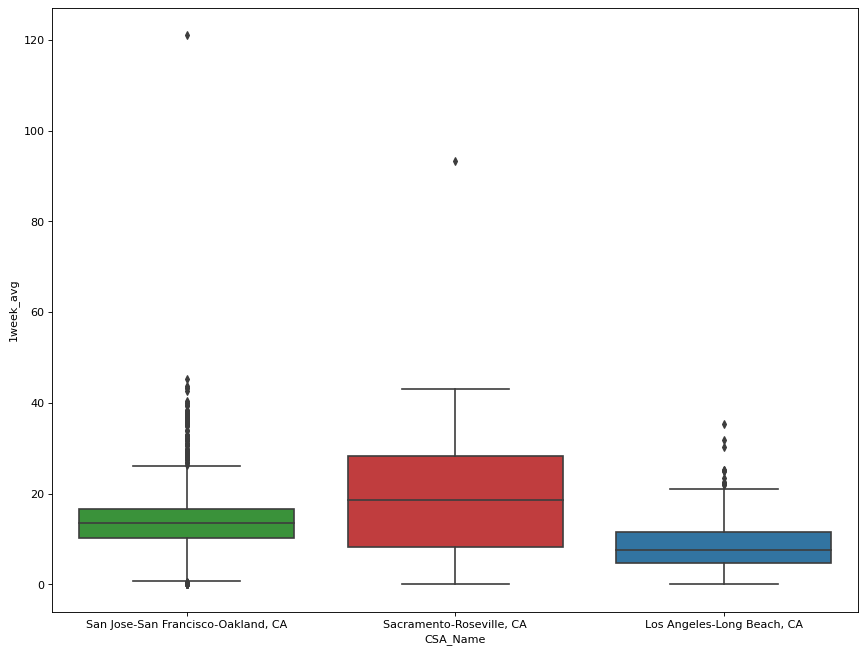

In [843]:
#POPULATION BY METROPOLITAN AREA
plt.figure(figsize=(13, 10), dpi=80)
sns.boxplot(x='CSA_Name', y='1week_avg', data=localities,
            palette=palette, notch=False)

## $6 Temperature x AQI -- SIZE: CBSA Population 
### LA is hottest, and biggest by CBSA Population -- temperature increases only seem to produce slight deteriarations of air quality in Sacremento, temperature seems to have minimal impact in the other two cities

In [875]:
#LOGGED -- AQI AND TEMPERATURE BY REGION
fig = px.scatter(localities, x='temp_f', y=target, color="CSA_Name",
                 size='CBSA_POP', hover_data=['HH'], trendline='ols')
fig.show()


In [873]:
#NOT LOGGED -- AQI AND TEMPERATURE BY REGION
fig = px.scatter(localities, x='temp_f', y="1week_avg", color="CSA_Name",
                 size='CBSA_POP', hover_data=['HH'], trendline='ols')
fig.show()


In [872]:
#LOGGED - AQI AND TEMPERATUR BY LOCALITIES
fig = px.scatter(localities, x='temp_f', y=target, color="locality",
                 size='CBSA_POP', hover_data=['HH'], trendline='ols')
fig.show()

## $3 Impact of land area: LOG of ACRES x AQI -- SIZE: road network density
### as acreage decreases, air quality seems to get worse

In [871]:
#1 LOGGED -- AQI AND LOG OF ACRES - SEGMENTED BY REGION -- THE SIZE OF BUBBLES REPRESENTS THE ROAD NETWORK DENSITY
fig = px.scatter(localities, x='Log_Acres', y=target, color="CSA_Name",
                 size='D3A', hover_data=['HH'], trendline='ols')
fig.show()

In [869]:
#1 LOGGED -- ACRES AND LOG OF AQI SEGMENTED BY LOCALITIES -- THE SIZE OF BUBBLES REPRESENTS THE ROAD NETWORK DENSITY
fig = px.scatter(localities, x='Log_Acres', y=target, color="locality",
                 size='D3A', hover_data=['HH'], trendline='ols')
fig.show()


## $4 Working age population within 45 minutes auto travel time and AQI on 

### LA has more working people within a 45 minute drive of their jobs, better air quality, and larger employable population

In [868]:
#1 week average by the population within a 45 minute auto travel time and AQI by region
fig = px.scatter(localities, x='log_D5AE', y=target, color="CSA_Name",
                 hover_data=['D4A_Ranked'], trendline='ols', opacity=.35, height=400,
                 width=1100)
fig.update_layout(
    title="Working age population within 45 minutes of their jobs and the log of the average AQI for the week",
    xaxis_title="Working age population within a 45 minute drive time of their Jobs",
    yaxis_title="Log of 1 week AQI",
    legend_title="Combined Statistical Area (CSA)",
    font=dict(
        family="Courier New, monospace",
        size=12,
        color="RebeccaPurple"
    )
)
fig.show()
#explore percentage 0f employees
#WE LIKE 

In [867]:
#1 week average by the population within a 45 minute auto travel time Aand AQI by locality
fig = px.scatter(localities, x='log_D5AE', y=target, color="locality",
                 hover_data=['D4A_Ranked'], trendline='ols', opacity=.4, height=400,
                 width=1100)
fig.update_layout(
    title="Employees within 45 minutes of their jobs and the log of the average AQI for the week by locality",
    xaxis_title="Working age population within a 45 minute drive time of their Jobs",
    yaxis_title="Log of 1 week AQI",
    legend_title="Combined Statistical Area (CSA)",
    font=dict(
        family="Courier New, monospace",
        size=12,
        color="RebeccaPurple"
    )
)
fig.show()
#explore percentage 0f employees
#WE LIKE SAVE

### $5 impact of wages on AQI

In [859]:
#PROPORTION OF LOWER WAGE WORKERS AND LOG OF AQI
fig = px.scatter(localities, x='R_PCTLOWWAGE', y=target, color="CSA_Name", opacity=.4, trendline='ols',
                 hover_data=['D4A_Ranked'])
fig.show()
'''#unprotected land size (not parks etc. )
fig = px.scatter(localities, x=target, y="R_PCTLOWWAGE", color="CSA_Name", size='CBSA_EMP', trendline='ols',
                 hover_data=['D4A_Ranked'])
fig.show()
'''

'#unprotected land size (not parks etc. )\nfig = px.scatter(localities, x=target, y="R_PCTLOWWAGE", color="CSA_Name", size=\'CBSA_EMP\', trendline=\'ols\',\n                 hover_data=[\'D4A_Ranked\'])\nfig.show()\n'

In [ ]:
'''Index(['temp_f', 'CBSA_POP', 'CBSA_EMP', 'Ac_Land', 'Pct_AO2p', 'Log_Acres',
       'Pct_HH_occupied', 'pct_E8_Svc', 'log_D5AE', 'pow_D5CE'],
      dtype='object')'''

### $6 total road network density and AQI 
#### LA has higher road net work density and sacramento may have higher wage, but there is a strong tend line indicating that better wage jobs are in areas with worst air quality

In [866]:
# CITY -- road network density - bigger bubbles are higher wages
fig = px.scatter(localities, x='D3A', y=target, color="CSA_Name",
                 size='R_HiWageWk', hover_data=['D4A_Ranked'], trendline="ols")
fig.show()

In [863]:
# ROAD NETWORK DENSITY AND THE LOG OF AIR QUALITY
fig = px.scatter(localities, x='NatWalkInd', y=target, color="CSA_Name",
                 opacity=.5, hover_data=['D4A_Ranked'], trendline="ols", height=400, width=900)

fig.update_layout(
    title="Walkability and the log of AQI",
    xaxis_title="Walkability Index Rating (Higher numbers are more walkable)",
    yaxis_title="Log of Weekly AQI",
    legend_title="Combined Statistical Area (CSA)",
    font=dict(
        family="Courier New, monospace",
        size=12,
        color="RebeccaPurple"
    )
)
fig.show()

In [864]:
# WALKABILITY INDEX AND AQI SEGMENTED BY LOCALITY
fig = px.scatter(localities, x='NatWalkInd', y=target, color="locality",
                 opacity=.5, hover_data=['D4A_Ranked'], trendline="ols")
fig.update_layout(
    title="Walkability and the log of AQI",
    xaxis_title="Walkability Index Rating (Higher numbers are more walkable)",
    yaxis_title="Log of AQI",
    legend_title="Combined Statistical Area (CSA)",
    font=dict(
        family="Courier New, monospace",
        size=12,
        color="RebeccaPurple"
    )
)
fig.show()


In [865]:
#INCOME AND LOCALITY/REGION BAR PLOT
df = px.data.tips()
fig = px.histogram(localities, x="locality", y='R_HiWageWk',
                   color='CSA_Name', barmode='group',
                   histfunc='avg',
                   height=400, width=900)

fig.update_layout(
    title="Income by Combined Statistical Area (CSA) and locality",
    #xaxis_title="Log of 1 week AQI",
    yaxis_title="workers earning $3333/month or more",
    legend_title="Combined Statistical Area (CSA)",
    font=dict(
        family="Courier New, monospace",
        size=12,
        color="RebeccaPurple"
    )
)
fig.show()
#BLKGRPCE
#NatWalkInd


In [705]:
'''
df = px.data.medals_long()
fig = px.bar(sacla, x="CSA_Name", y=target, color="BLKGRPCE", text_auto=True)
fig.show()
long_df = px.data.medals_long()
fig = px.bar(localities, x='locality', y=target,
             color="CSA_Name", title="Long-Form Input")
fig.show()'''

'\ndf = px.data.medals_long()\n\nfig = px.bar(sacla, x="CSA_Name", y=target, color="BLKGRPCE", text_auto=True)\nfig.show()\nlong_df = px.data.medals_long()\n\nfig = px.bar(localities, x=\'locality\', y=target,\n             color="CSA_Name", title="Long-Form Input")\nfig.show()'

In [ ]:
#SCRAP PAPER -- FACTORS THAT COULD INDICATE LOCALITY
# factors indicating rural
#E5_Ind - industrial jobs
#D1d -- activity density 
#D3a -- road network density 
#D4c -- frequency transit within .25
#D4D -- Aggregate frequency of transit service [D4c] per square mile
#D5ae -- working age within 45 mins auto travel time
#D5br -- jobs within 45 min transit commute
##office jobs
#log acres
#density
#population
#percent a02+
#NARROWING DOWN TO BASED ON ACRES
#la_rural = la[la['Log_Acres'].astype(int) > 5.5]
#la_rural.info()
#la_ubn = la[la['Log_Acres'].astype(int) < 5.5]
#la_ubn.info()
